# Wine Quality pridiction model

### By Hitesh Kumar Sharma

Problem Statement

The red wine industry shows a recent exponential growth as social drinking is on the rise. Nowadays, industry
players are using product quality certifications to promote their products. This is a time-consuming process
and requires the assessment given by human experts, which makes this process very expensive.

Also, the price of red wine depends on a rather abstract concept of wine appreciation by wine tasters,
opinions among whom may have a high degree of variability. Another vital factor in red wine certification and
quality assessment is physicochemical tests, which are laboratory-based and consider factors like acidity, pH
level, sugar, and other chemical properties. The red wine market would be of interest if the human quality of
tasting can be related to wine’s chemical properties so that certification and quality assessment and
assurance processes are more controlled.

Determine which features are the best quality red wine indicators and generate insights into each of these
factors to our our model’s red wine quality. Predict the quality of wine on the basis of giving features. Deploy the model

Importing all libraries

In [1]:
import matplotlib.pyplot as plt
import pandas as pd 
import warnings
warnings.filterwarnings('ignore')
plt.style.use('dark_background')


In [2]:
df=pd.read_csv('Red Wine Quality.csv')

#all the informartion with respect to features
print('SHAPE -',df.shape,'\n DESCRIBE-\n',df.describe())

SHAPE - (1599, 12) 
 DESCRIBE-
        fixed acidity  volatile acidity  citric acid  residual sugar  \
count    1599.000000       1599.000000  1599.000000     1599.000000   
mean        8.319637          0.527821     0.270976        2.538806   
std         1.741096          0.179060     0.194801        1.409928   
min         4.600000          0.120000     0.000000        0.900000   
25%         7.100000          0.390000     0.090000        1.900000   
50%         7.900000          0.520000     0.260000        2.200000   
75%         9.200000          0.640000     0.420000        2.600000   
max        15.900000          1.580000     1.000000       15.500000   

         chlorides  free sulfur dioxide  total sulfur dioxide      density  \
count  1599.000000          1599.000000           1599.000000  1599.000000   
mean      0.087467            15.874922             46.467792     0.996747   
std       0.047065            10.460157             32.895324     0.001887   
min       0.0120

In [66]:
from pandas_profiling import ProfileReport
a=ProfileReport(df)
a

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Checking for Duplicate

In [3]:
print('total duplicate before',df.duplicated().sum())
print('shape before duplicate', df.shape)
print(df.duplicated().sum())
df.drop_duplicates(inplace=True)
print('shape after droping duplicate',df.shape)

total duplicate before 240
shape before duplicate (1599, 12)
240
shape after droping duplicate (1359, 12)


## Visualization

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

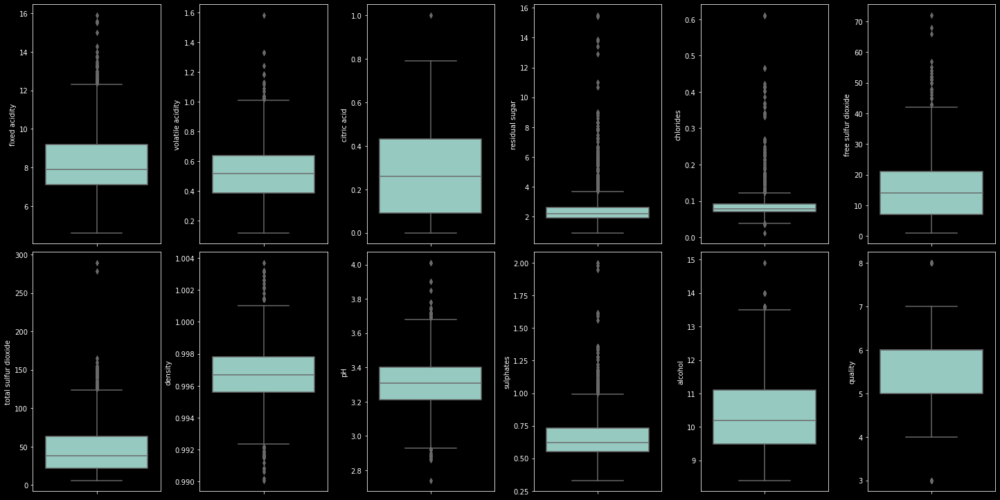

In [4]:
fig,ax = plt.subplots(ncols=6,nrows=2,figsize=(20,10))
index=0
ax=ax.flatten()

for cols , value in df.items():
    if cols != 'type':
        sns.boxplot(y=cols,data=df,ax=ax[index])
        index += 1
        
        
plt.tight_layout(pad=0.5,w_pad=0.7,h_pad=0.7)
plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

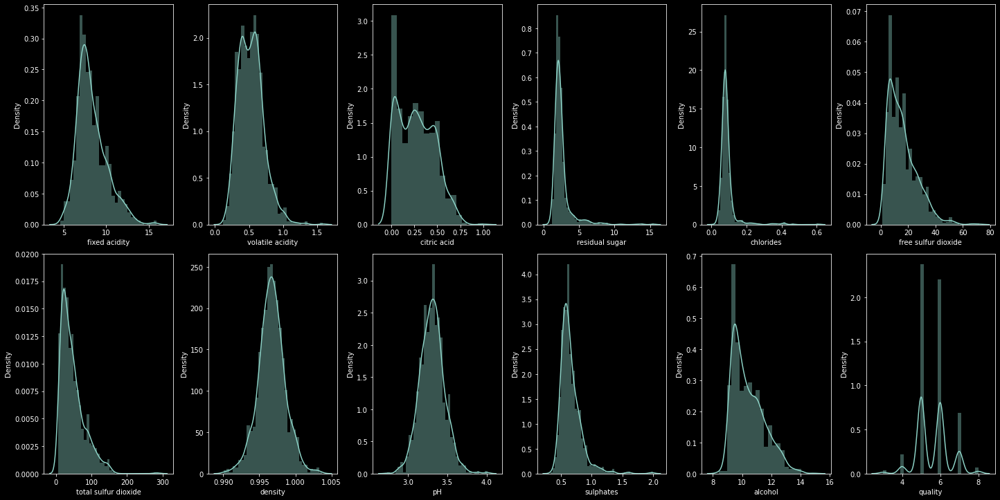

In [5]:
fig,ax = plt.subplots(ncols=6,nrows=2,figsize=(20,10))
index=0
ax=ax.flatten()

for cols , value in df.items():
    if cols != 'type':
        sns.distplot(value,ax=ax[index])
        index += 1
        
        
plt.tight_layout(pad=0.5,w_pad=0.7,h_pad=0.7)
plt.show()

Our data seem to be easily distributed but we got some right skewed data for residual
clorides , free sulphur dioxide ,total sulphur dioxide and sulphate

### Checking for the outlier and skewness

In [6]:
#Removing outliers first then skewness
from scipy.stats import zscore
z=abs(zscore(df))
print(z.shape)
df=df[(z<3).all(axis=1)]
df.shape

(1359, 12)


(1232, 12)

fixed acidity
0.8061619824138205


<IPython.core.display.Javascript object>

volatile acidity
0.43308445717948635


<IPython.core.display.Javascript object>

citric acid
0.2759663007760168


<IPython.core.display.Javascript object>

residual sugar
2.3718232268318102


<IPython.core.display.Javascript object>

chlorides
2.461746675680815


<IPython.core.display.Javascript object>

free sulfur dioxide
0.8662329717800913


<IPython.core.display.Javascript object>

total sulfur dioxide
1.1611815549035225


<IPython.core.display.Javascript object>

density
0.017661782151063662


<IPython.core.display.Javascript object>

pH
0.1186075802936275


<IPython.core.display.Javascript object>

sulphates
0.9494203726359354


<IPython.core.display.Javascript object>

alcohol
0.7664142127411996


<IPython.core.display.Javascript object>

quality
0.4022066765498909


<IPython.core.display.Javascript object>

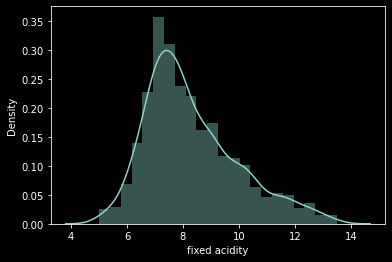

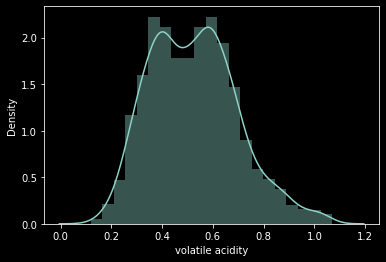

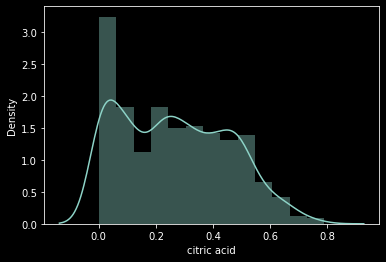

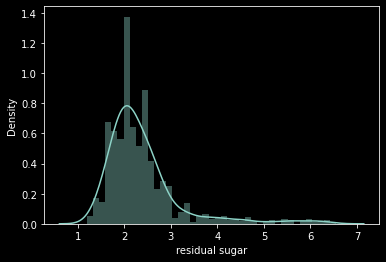

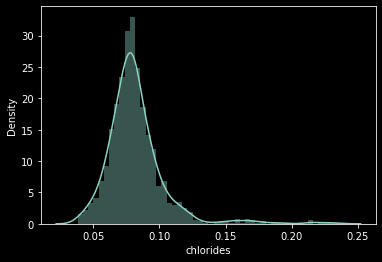

...

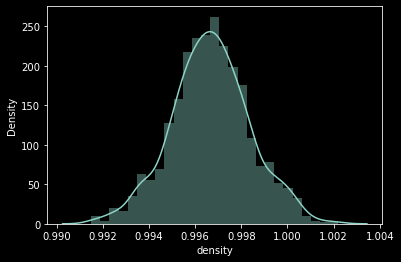

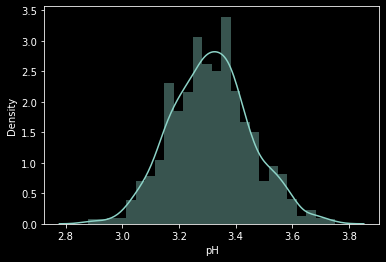

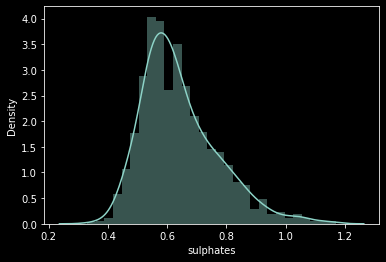

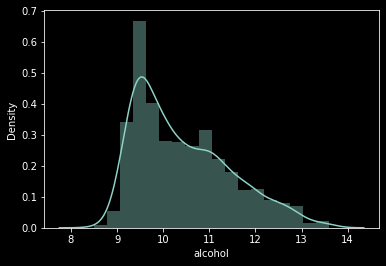

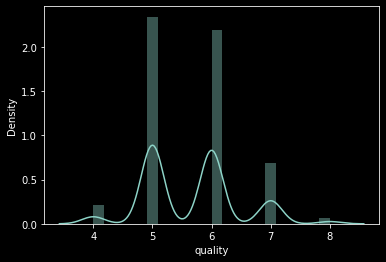

In [7]:
from scipy.stats import skew
for col in df:
    print(col)
    print(skew(df[col]))
    plt.figure()
    sns.distplot(df[col])
plt.show()

#### Some of the data has more skewness

In [8]:
df['fixed acidity']=np.sqrt(df['fixed acidity'])
df['residual sugar']=np.sqrt(df['residual sugar'])
df['chlorides']=np.sqrt(df['chlorides'])
df['free sulfur dioxide']=np.sqrt(df['free sulfur dioxide'])
df['pH']=np.sqrt(df['pH'])
for col in df:
    print(col)
    print(skew(df[col]))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

fixed acidity
0.5825645881498726
volatile acidity
0.43308445717948635
citric acid
0.2759663007760168
residual sugar
1.732402131415575
chlorides
1.4618660458065675
free sulfur dioxide
0.318084567977603
total sulfur dioxide
1.1611815549035225
density
0.017661782151063662
pH
0.055277424173582446
sulphates
0.9494203726359354
alcohol
0.7664142127411996
quality
0.4022066765498909


### Checking for the null values

In [9]:
df.isnull().sum()


fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

#### There is no null values in our data 

## Univeriate Analysis

In [10]:
df['quality_map']=df['quality'].map({3:'bad',4:'bad',
                                    5:'bad',6:'good',
                                    7:'good',8:'good'})

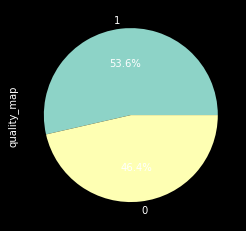

In [54]:
df['quality_map'].value_counts().plot(kind='pie',autopct='%1.1f%%')
plt.show()

3.8 % of wine is consider as bad quality

13.7% of wine is considered as good quality

82.5% of wine is considered as average quality


<function matplotlib.pyplot.show(close=None, block=None)>

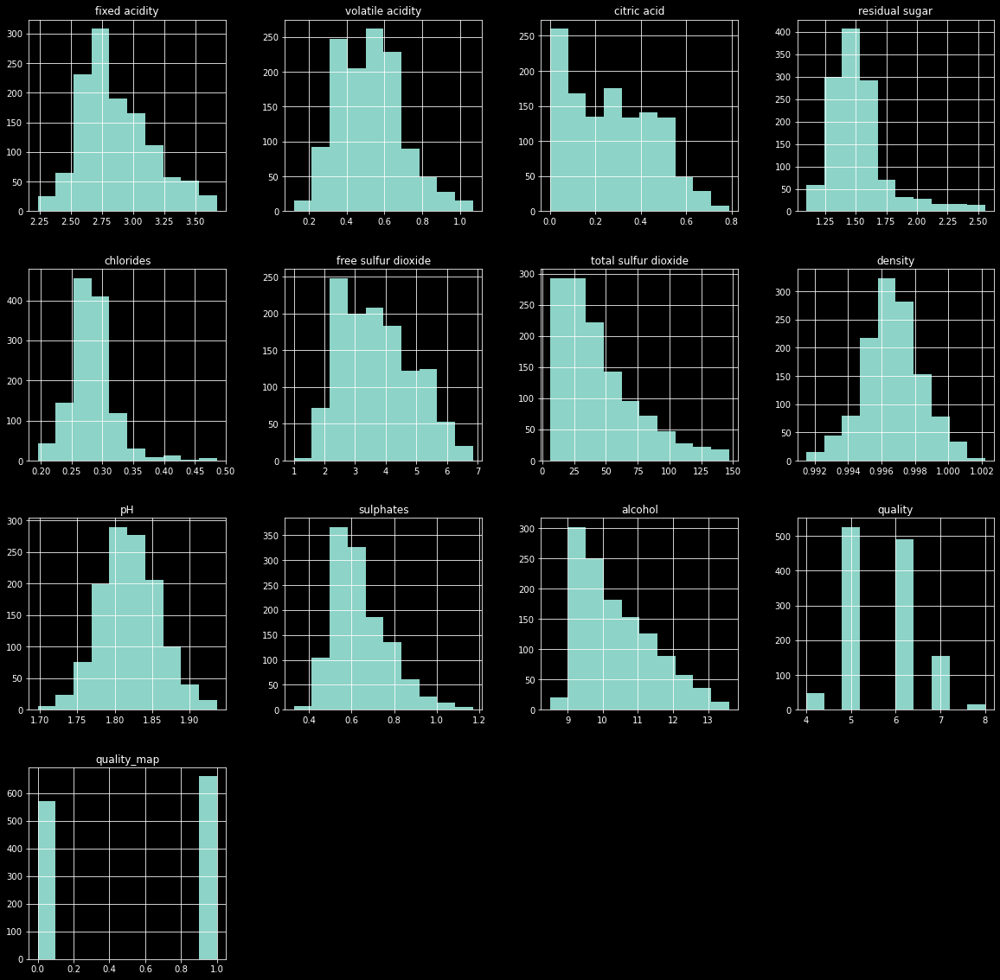

In [55]:
df.hist(figsize=(20,20))
plt.show

## Biveriate Analysis

<IPython.core.display.Javascript object>

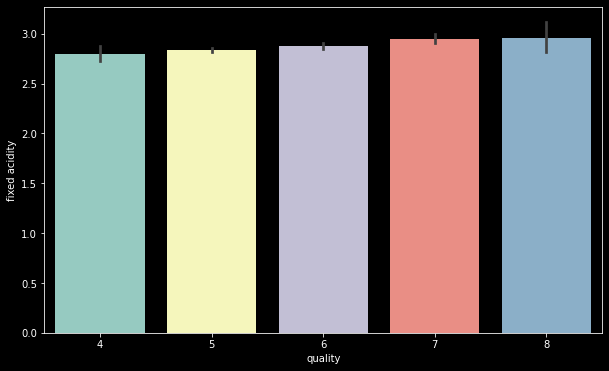

In [56]:
fig = plt.figure(figsize = (10,6))
sns.barplot(x = 'quality', y = 'fixed acidity', data = df)
plt.show()

 Primary fixed acids found in wine are tartaric, succinic, citric, and malic . The sum of all the kind of acids determine the fixed acidity
    
The data spred across the quality is quit similier 

<IPython.core.display.Javascript object>

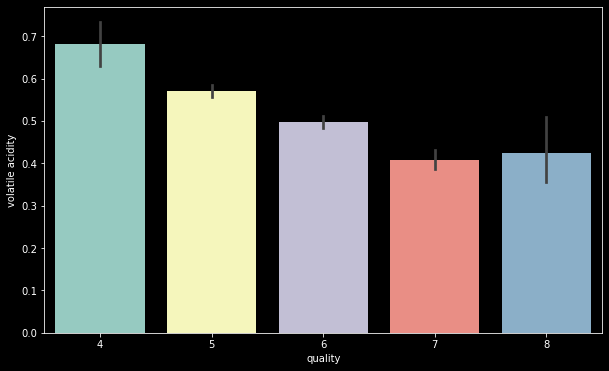

In [57]:
fig = plt.figure(figsize = (10,6))
sns.barplot(x = 'quality', y = 'volatile acidity', data = df)
plt.show()

The primary volatile acidity is the acetic acid which have a smell and taste of vinegar.
Responsible for the Aroma


From the above case we can see that the less the volatile acidity is the good is wine 
considerd

<IPython.core.display.Javascript object>

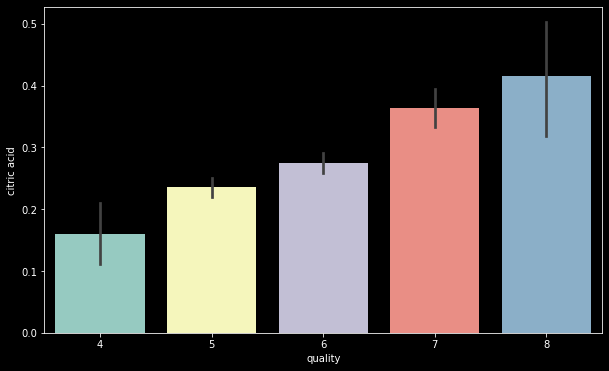

In [59]:
fig = plt.figure(figsize = (10,6))
sns.barplot(x = 'quality', y = 'citric acid', data = df)
plt.show()

Citric acid is used to increase acidity.  It is also used to make wine taste fresh 

So from the above figure we can say that higher the citric acid higher the quality of wine 


<IPython.core.display.Javascript object>

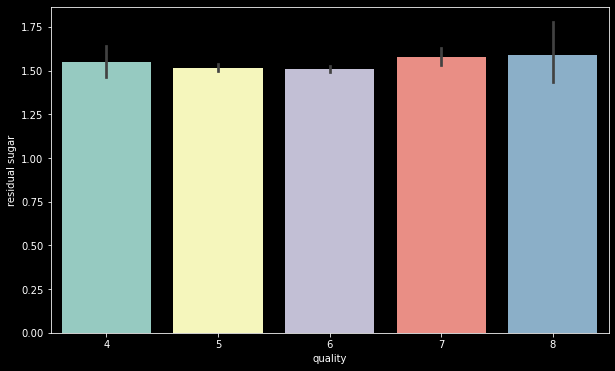

In [60]:
fig = plt.figure(figsize = (10,6))
sns.barplot(x = 'quality', y = 'residual sugar', data = df)
plt.show()

Residual sugar refers to the sugars left unfermented in a finished wine.

It is responsible for the sweetness of wine 

From the above grap we can say that the sweetness of all the wine is quite similar


<IPython.core.display.Javascript object>

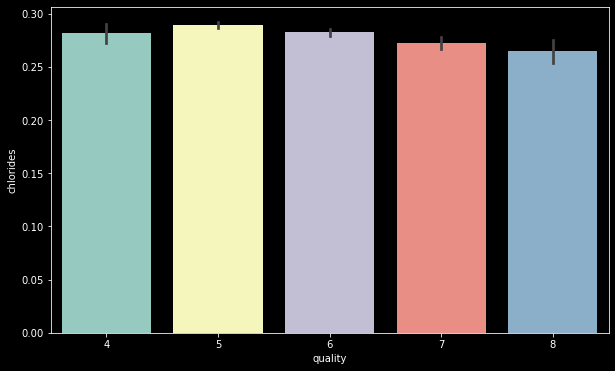

In [61]:
fig = plt.figure(figsize = (10,6))
sns.barplot(x = 'quality', y = 'chlorides', data = df)
plt.show()

Chlorides refer to  amount of salt present in wine.

From above figure we can say that the less the chloride the better the wine.

<IPython.core.display.Javascript object>

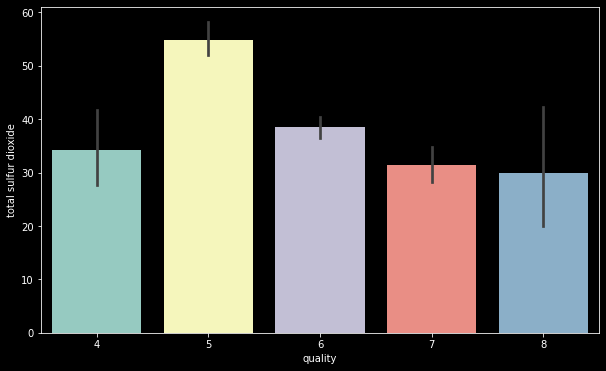

In [62]:
fig = plt.figure(figsize = (10,6))
sns.barplot(x = 'quality', y = 'total sulfur dioxide', data = df)
plt.show()

Sulfur dioxide is used for the preservation of wine .
It helps wine in off-odors and getting brown.

From above figure we can say that a good wine has a sulphate inbetween 3 and 4 




<IPython.core.display.Javascript object>

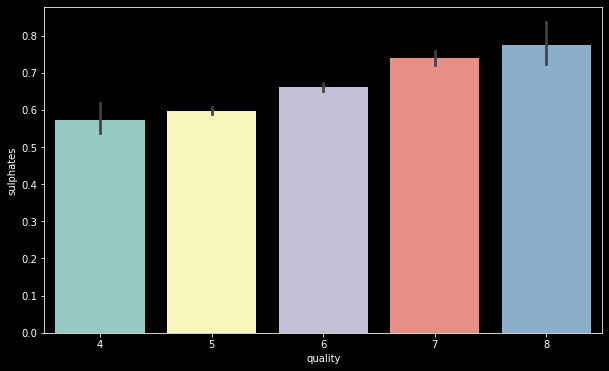

In [63]:
fig = plt.figure(figsize = (10,6))
sns.barplot(x = 'quality', y = 'sulphates', data = df)
plt.show()

<IPython.core.display.Javascript object>

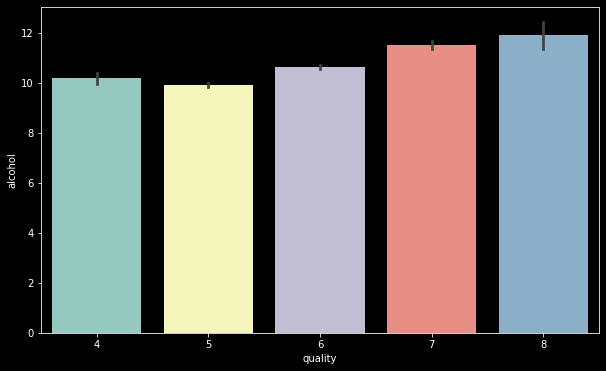

In [64]:
fig = plt.figure(figsize = (10,6))
sns.barplot(x = 'quality', y = 'alcohol', data = df)
plt.show()

<IPython.core.display.Javascript object>

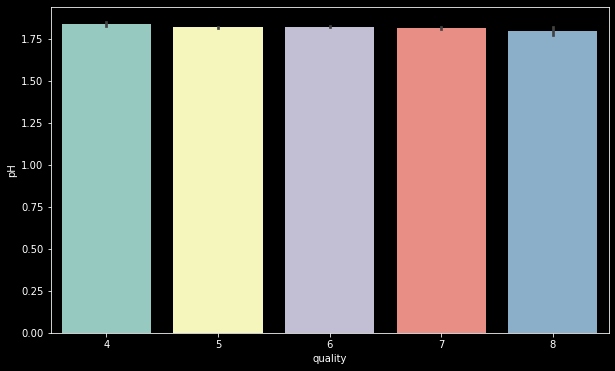

In [65]:
fig = plt.figure(figsize = (10,6))
sns.barplot(x = 'quality', y = 'pH', data = df)
plt.show()

## Multiveriate Analysis

<IPython.core.display.Javascript object>

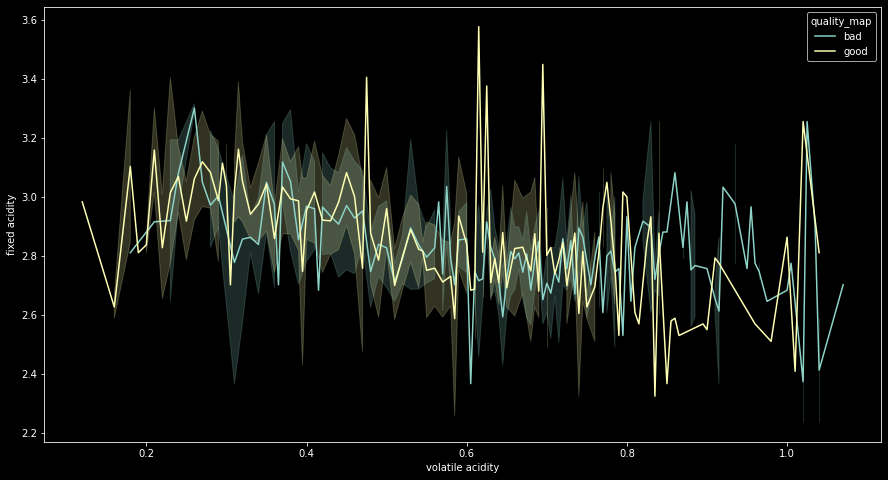

In [22]:
figure = plt.figure(figsize=(15,8))
sns.lineplot(x="volatile acidity",y="fixed acidity",hue="quality_map",data=df)
plt.show()

If the content of Volatile Acidity increase, It decreases the Quality of wine

Best Quality of wine should have more content of fixed Acidity and less Vilatile Acidity

<IPython.core.display.Javascript object>

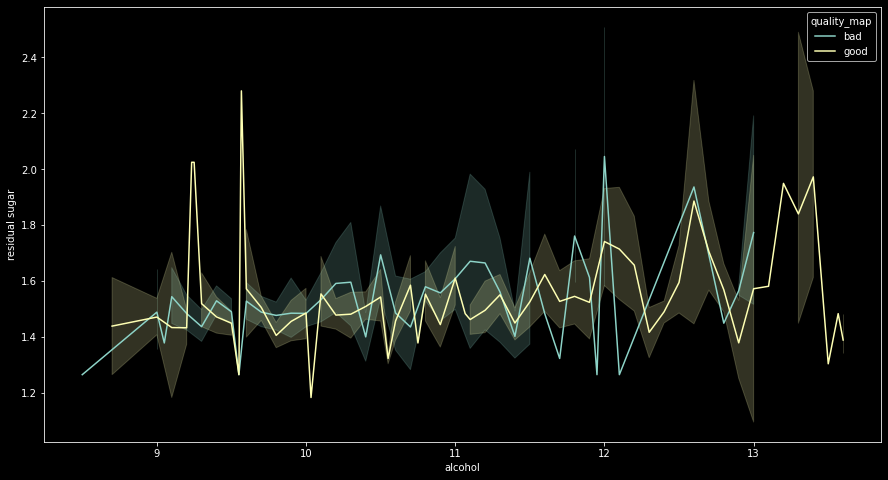

In [23]:
figure = plt.figure(figsize=(15,8))
sns.lineplot(x="alcohol",y="residual sugar",hue="quality_map",data=df)
plt.show()

If content of Residual Sugar increases, it decreases the Quality of Wine 

Best Quality of winr should have less content of Residual sugar and Alcohol

In [53]:
figsize=(20,20)
fig = px.scatter_matrix(df,dimensions=['fixed acidity','citric acid','sulphates','residual sugar','pH'],color='quality_map')
fig.show()

<IPython.core.display.Javascript object>

## Correlation

<IPython.core.display.Javascript object>

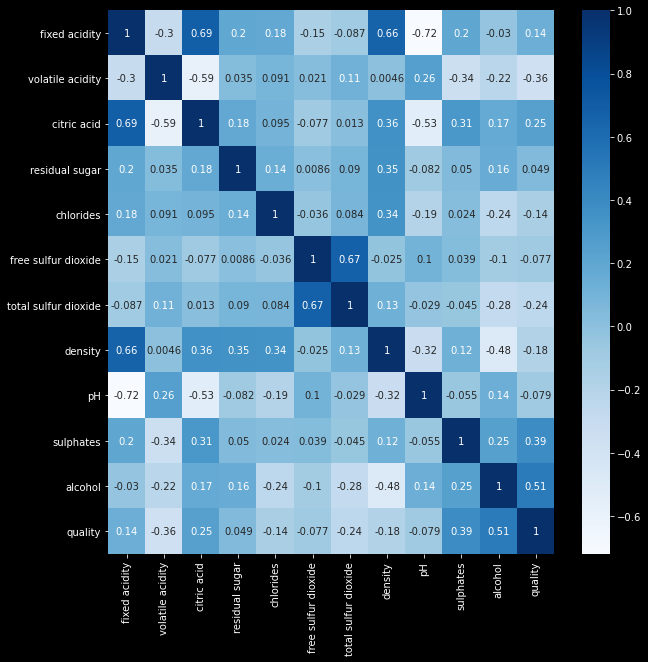

In [25]:
plt.figure(figsize=(10,10))
sns.heatmap(df.corr(),cmap="Blues",annot=True)
plt.show()

From the above observation we see that our two columns "free sulfur dioxide" & 
"total sulfur dioxide" are kind of same and also correlation between them is quit height

so we can remove on of them



<AxesSubplot:ylabel='quality_map'>

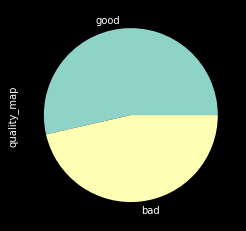

In [27]:
df['quality_map'].value_counts().plot(kind='pie')

#### Now let us seperate the data in dependent and independent variable

In [28]:
encoder=LabelEncoder()
df['quality_map']=encoder.fit_transform(df['quality_map'])
df = df.sample(frac = 1)

<IPython.core.display.Javascript object>

In [29]:
x=df.drop(['quality','quality_map'],axis=1)
y=df.iloc[:,-1:]



In [30]:
y.value_counts()

quality_map
1              660
0              572
dtype: int64

#### Now let us divide the data into train test split


In [31]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.25,random_state=42)

In [32]:
print(df.shape,xtrain.shape,ytrain.shape)

(1232, 13) (924, 11) (924, 1)


### Scaling the data

Our data is unbalanced and difference between the variable values is high

In [33]:
from sklearn.preprocessing import MinMaxScaler
ssm=MinMaxScaler()
xtrain=ssm.fit_transform(xtrain)
xtest=ssm.fit_transform(xtest)



## Applying Model

### K-Nearest Neighbor (KNN)


In [34]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score , confusion_matrix , classification_report

In [35]:
accuracy=[]
for i in range (1,31):
    knn=KNeighborsClassifier(n_neighbors=i)
    knn.fit(xtrain,ytrain)
    ypred=knn.predict(xtest)
    ac=accuracy_score(ytest,ypred)
    accuracy.append(ac)

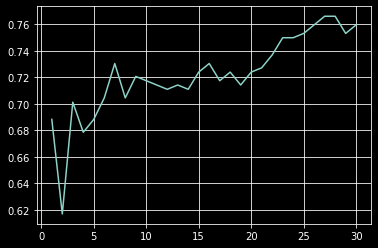

In [36]:
plt.plot(range(1,31),accuracy)
plt.grid(True)
plt.show()

In [40]:
knn= KNeighborsClassifier(n_neighbors=15)
knn.fit(xtrain,ytrain)
train_pred =knn.predict (xtrain)
test_pred= knn.predict(xtest)
print('Training Accuracy :',accuracy_score(ytrain,train_pred))
print('Test Accuracy :',accuracy_score(ytest,test_pred))
print('Confusion Matrix: \n',confusion_matrix(ytest,test_pred))
print('classification Report : \n',classification_report(ytest,test_pred))


Training Accuracy : 0.7608225108225108
Test Accuracy : 0.724025974025974
Confusion Matrix: 
 [[109  36]
 [ 49 114]]
classification Report : 
               precision    recall  f1-score   support

           0       0.69      0.75      0.72       145
           1       0.76      0.70      0.73       163

    accuracy                           0.72       308
   macro avg       0.72      0.73      0.72       308
weighted avg       0.73      0.72      0.72       308



In [ ]:
#List Hyperparameters that we want to tune.
leaf_size = list(range(1,50))
n_neighbors = list(range(1,30))
p=[1,2]
#Convert to dictionary
hyperparameters = dict(leaf_size=leaf_size, n_neighbors=n_neighbors, p=p)
#Create new KNN object
knn_2 = KNeighborsClassifier()
#Use GridSearch
clf = GridSearchCV(knn_2, hyperparameters, cv=10)
#Fit the model
best_model = clf.fit(xtrain,ytrain)
#Print The value of best Hyperparameters
print('Best leaf_size:', best_model.best_estimator_.get_params()['leaf_size'])
print('Best p:', best_model.best_estimator_.get_params()['p'])
print('Best n_neighbors:', best_model.best_estimator_.get_params()['n_neighbors'])

In [41]:
knn= KNeighborsClassifier(n_neighbors=19,leaf_size=1,p=1)
knn.fit(xtrain,ytrain)
train_pred =knn.predict (xtrain)
test_pred= knn.predict(xtest)
print('Training Accuracy :',accuracy_score(ytrain,train_pred))
print('Test Accuracy :',accuracy_score(ytest,test_pred))
print('Confusion Matrix: \n',confusion_matrix(ytest,test_pred))
print('classification Report : \n',classification_report(ytest,test_pred))

Training Accuracy : 0.7510822510822511
Test Accuracy : 0.7435064935064936
Confusion Matrix: 
 [[108  37]
 [ 42 121]]
classification Report : 
               precision    recall  f1-score   support

           0       0.72      0.74      0.73       145
           1       0.77      0.74      0.75       163

    accuracy                           0.74       308
   macro avg       0.74      0.74      0.74       308
weighted avg       0.74      0.74      0.74       308



### Random Forest Classifier

In [42]:
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier()
rfc.fit(xtrain,ytrain)
Train_pred=rfc.predict(xtrain)
Test_pred=rfc.predict(xtest)
print('Training Accuracy :',accuracy_score(ytrain,Train_pred))
print('Test Accuracy :',accuracy_score(ytest,Test_pred))
print('Confusion Matrix: \n',confusion_matrix(ytest,Test_pred))
print('classification Report : \n',classification_report(ytest,Test_pred))




Training Accuracy : 1.0
Test Accuracy : 0.762987012987013
Confusion Matrix: 
 [[123  22]
 [ 51 112]]
classification Report : 
               precision    recall  f1-score   support

           0       0.71      0.85      0.77       145
           1       0.84      0.69      0.75       163

    accuracy                           0.76       308
   macro avg       0.77      0.77      0.76       308
weighted avg       0.78      0.76      0.76       308



In [ ]:
from pprint import pprint
print('Parameters currently in use:\n')
pprint(rfc.get_params())


In [ ]:
from sklearn.model_selection import  GridSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 1, stop = 300, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,5,6,7,8,9,10]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}


In [ ]:
param_grid = {
    'bootstrap': [True],
    'max_depth': [70,80, 90,100],
    'max_features': [2, 3,4],
    'min_samples_leaf': [5,6],
    'min_samples_split': [6,8,9],
    'n_estimators': [200,300,400,500]
}
# Create a based model
rf_ = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf_, param_grid = random_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [ ]:
grid_search.fit(xtrain,ytrain)
grid_search.best_params_

In [43]:
grfc=RandomForestClassifier(bootstrap=True,max_depth=60,max_features=3,min_samples_leaf=8
                           ,min_samples_split=20,n_estimators=341
                           )
grfc.fit(xtrain,ytrain)
G_Train_pred=grfc.predict(xtrain)
G_Test_pred=grfc.predict(xtest)
print('Training Accuracy :',accuracy_score(ytrain,G_Train_pred))
print('Test Accuracy :',accuracy_score(ytest,G_Test_pred))
print('Confusion Matrix: \n',confusion_matrix(ytest,G_Test_pred))
print('classification Report : \n',classification_report(ytest,G_Test_pred))



Training Accuracy : 0.8538961038961039
Test Accuracy : 0.7694805194805194
Confusion Matrix: 
 [[126  19]
 [ 52 111]]
classification Report : 
               precision    recall  f1-score   support

           0       0.71      0.87      0.78       145
           1       0.85      0.68      0.76       163

    accuracy                           0.77       308
   macro avg       0.78      0.77      0.77       308
weighted avg       0.79      0.77      0.77       308



## SVM

In [44]:
from sklearn import svm

In [45]:
clf_=svm.SVC(probability=True)
clf_.fit(xtrain,ytrain)
clf_train_pred=clf_.predict(xtrain)
clf_test_pred=clf_.predict(xtest)
print('Training Accuracy :',accuracy_score(ytrain,clf_train_pred))
print('Test Accuracy :',accuracy_score(ytest,clf_test_pred))
print('Confusion Matrix: \n',confusion_matrix(ytest,clf_test_pred))
print('classification Report : \n',classification_report(ytest,clf_test_pred))





Training Accuracy : 0.7911255411255411
Test Accuracy : 0.75
Confusion Matrix: 
 [[122  23]
 [ 54 109]]
classification Report : 
               precision    recall  f1-score   support

           0       0.69      0.84      0.76       145
           1       0.83      0.67      0.74       163

    accuracy                           0.75       308
   macro avg       0.76      0.76      0.75       308
weighted avg       0.76      0.75      0.75       308



In [ ]:
param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
 


In [ ]:
grid = GridSearchCV(clf_, param_grid, refit = True, verbose = 3)
 
# fitting the model for grid search
grid.fit(xtrain, ytrain)

In [ ]:

# print best parameter after tuning
print(grid.best_params_)
 
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

In [46]:
svm_clf=svm.SVC(C=1000,gamma=0.01,kernel='rbf')
svm_clf.fit(xtrain,ytrain)
grid_predictions_test = svm_clf.predict(xtest)
grid_prediction_train = svm_clf.predict(xtrain)
 
# print classification report
print('Training Accuracy :',accuracy_score(ytrain,grid_prediction_train))
print('Test Accuracy :',accuracy_score(ytest,grid_predictions_test))
print('Confusion Matrix: \n',confusion_matrix(ytest,grid_predictions_test))
print(classification_report(ytest, grid_predictions_test))

Training Accuracy : 0.7424242424242424
Test Accuracy : 0.75
Confusion Matrix: 
 [[117  28]
 [ 49 114]]
              precision    recall  f1-score   support

           0       0.70      0.81      0.75       145
           1       0.80      0.70      0.75       163

    accuracy                           0.75       308
   macro avg       0.75      0.75      0.75       308
weighted avg       0.76      0.75      0.75       308



## ADABOOST classifier

In [47]:
from sklearn.ensemble import AdaBoostClassifier
abclf=AdaBoostClassifier()
abclf.fit(xtrain,ytrain)
ada_train_pred=abclf.predict(xtrain)
ada_test_pred=abclf.predict(xtest)
print('Training Accuracy :',accuracy_score(ytrain,ada_train_pred))
print('Test Accuracy :',accuracy_score(ytest,ada_test_pred))
print('Confusion Matrix: \n',confusion_matrix(ytest,ada_test_pred))
print('classification Report : \n',classification_report(ytest,ada_test_pred))




Training Accuracy : 0.801948051948052
Test Accuracy : 0.7045454545454546
Confusion Matrix: 
 [[114  31]
 [ 60 103]]
classification Report : 
               precision    recall  f1-score   support

           0       0.66      0.79      0.71       145
           1       0.77      0.63      0.69       163

    accuracy                           0.70       308
   macro avg       0.71      0.71      0.70       308
weighted avg       0.72      0.70      0.70       308



In [ ]:
param_grid={
    'n_estimators':[100,150,200,250,300,350,400],
    'learning_rate':[0.001,0.01,0.1,0.2,0.5]
}

gs_ab=GridSearchCV(AdaBoostClassifier(),param_grid=param_grid)
gs_ab.fit(xtrain,ytrain)
print(gs_ab.best_estimator_)
print(gs_ab.best_params_)






In [48]:
abd_clf=AdaBoostClassifier(learning_rate=0.1,n_estimators=150)
abd_clf.fit(xtrain,ytrain)
gs_train_pred=abd_clf.predict(xtrain)
gs_test_pred=abd_clf.predict(xtest)
print('Training Accuracy :',accuracy_score(ytrain,gs_train_pred))
print('Test Accuracy :',accuracy_score(ytest,gs_test_pred))
print('Confusion Matrix: \n',confusion_matrix(ytest,gs_test_pred))
print('classification Report : \n',classification_report(ytest,gs_test_pred))




Training Accuracy : 0.7792207792207793
Test Accuracy : 0.737012987012987
Confusion Matrix: 
 [[119  26]
 [ 55 108]]
classification Report : 
               precision    recall  f1-score   support

           0       0.68      0.82      0.75       145
           1       0.81      0.66      0.73       163

    accuracy                           0.74       308
   macro avg       0.74      0.74      0.74       308
weighted avg       0.75      0.74      0.74       308



## XGB classifier

In [49]:
import xgboost as xgb
xgb_clf=xgb.XGBClassifier(eval_metric='mlogloss')
xgb_clf.fit(xtrain,ytrain)
xgb_train_pred=xgb_clf.predict(xtrain)
xgb_test_pred=xgb_clf.predict(xtest)
print('Training Accuracy :',accuracy_score(ytrain,xgb_train_pred))
print('Test Accuracy :',accuracy_score(ytest,xgb_test_pred))
print('Confusion Matrix: \n',confusion_matrix(ytest,xgb_test_pred))
print('classification Report : \n',classification_report(ytest,xgb_test_pred))





Training Accuracy : 1.0
Test Accuracy : 0.7207792207792207
Confusion Matrix: 
 [[115  30]
 [ 56 107]]
classification Report : 
               precision    recall  f1-score   support

           0       0.67      0.79      0.73       145
           1       0.78      0.66      0.71       163

    accuracy                           0.72       308
   macro avg       0.73      0.72      0.72       308
weighted avg       0.73      0.72      0.72       308



In [50]:
params = {
            'objective':'binary:logistic',
            'max_depth': 4,
            'alpha': 10,
            'learning_rate': 1.0,
            'n_estimators':100,
            'eval_metric':'mlogloss'
        }         

xgb_clf = xgb.XGBClassifier(**params)

xgb_clf.fit(xtrain,ytrain)

xgbh_train_pred=xgb_clf.predict(xtrain)
xgbh_test_pred=xgb_clf.predict(xtest)
print('Training Accuracy :',accuracy_score(ytrain,xgbh_train_pred))
print('Test Accuracy :',accuracy_score(ytest,xgbh_test_pred))
print('Confusion Matrix: \n',confusion_matrix(ytest,xgbh_test_pred))
print('classification Report : \n',classification_report(ytest,xgbh_test_pred))


Training Accuracy : 0.7911255411255411
Test Accuracy : 0.7435064935064936
Confusion Matrix: 
 [[126  19]
 [ 60 103]]
classification Report : 
               precision    recall  f1-score   support

           0       0.68      0.87      0.76       145
           1       0.84      0.63      0.72       163

    accuracy                           0.74       308
   macro avg       0.76      0.75      0.74       308
weighted avg       0.77      0.74      0.74       308



## Conclusion

In [51]:
print("K-Nearest Neighbor (KNN) :: ", metrics.accuracy_score(ytest,test_pred))
print('Random Forest Classifier :: ',metrics.accuracy_score(ytest,G_Test_pred))
print('SVM ::',metrics.accuracy_score(ytest,G_Test_pred))
print('ADABoost ::',metrics.accuracy_score(ytest,ada_test_pred))
print('XGB classifier ::',metrics.accuracy_score(ytest,xgbh_test_pred))

<IPython.core.display.Javascript object>

K-Nearest Neighbor (KNN) ::  0.7435064935064936


<IPython.core.display.Javascript object>

Random Forest Classifier ::  0.7694805194805194


<IPython.core.display.Javascript object>

SVM :: 0.7694805194805194


<IPython.core.display.Javascript object>

ADABoost :: 0.7045454545454546


<IPython.core.display.Javascript object>

XGB classifier :: 0.7435064935064936


## Deployment

In [52]:
import pickle
pickle.dump(xgb_clf,open('wine_xgb.pkl','wb'))
model=pickle.load(open('wine_xgb.pkl','rb'))
result = model.score(xtest,ytest)
print(result)

0.7435064935064936


### Summary

Our data consist of duplicate and outliers which were handeled during the preprocessing.

There are main three class in which our Quality is divided which are Avg , Good and Bad

After the EDA we can say that-
   
   volatile acidity for a good wine ranges between 0.4 to 0.5 
   
   Citric acid for a good wine is ranges between 0.4 to 0.5 
   
   Residual sugar for all the wines are greater than 1.30
   
   Chlorides for all the wine ranges between 0.25 to 0.30
   
   total sulfur dioxide for the good wine ranges between 30 to 40 
   
   Sulphate for the good wine are greater than 0.7
   
   Alcohol for the good wine are greater than 0.7
    
    
    
    
    
    
    
